# Quiz 4

In this quiz we were tasked with implementing an algorithm to build a mosaic out of a set of images. The steps to do so are:

* Compute the homography between each two consecutive images
  * Detect and compute the keypoints and descriptors of both images
  * Match said keypoints between both images
  * Use the keypoint set and the matches to get the source coordinates and the destination coordinates of the keypoints
  * Use these coordinates to compute the homography
* Warp one image to the perspective o the other using the homography matrix.
* Stitch warped image to the non warped image by overlaying the non warped image over the warped image where the keypoints coincide
* Blend both images together
  * Find the overlapping portion of the image
  * Use either fethering or mean value to compute each pixel in the overlapping section

In [2]:
import cv2
import numpy as np
import os
from itertools import tee
from matplotlib import pyplot as plt

In [3]:
def pairwise(iterable):
    "s -> (s0,s1), (s1,s2), (s2, s3), ..."
    a, b = tee(iterable)
    next(b, None)
    return zip(a, b)


In [78]:
def find_keypoints(img, descriptor_type='SIFT'):
    """Find the keypoints and descriptors for an image

    Args:
        img: Image to find keypoints and descriptors for

    Returns:
        keypoints: Keypoints found in the image
        descriptors: Descriptors found in the image
    """
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find keypoints
    sift = cv2.SIFT_create()
    if descriptor_type == 'SIFT':
        kp, des = sift.detectAndCompute(img, None)
    elif descriptor_type == 'BRIEF':
        kp = sift.detect(img, None)
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        kp, des = brief.compute(img, kp)
    else:
        return None, None
    # Return keypoints and descriptors
    return kp, des

def match_keypoints(des1, des2, descriptor_type='SIFT'):
    """Match keypoints between two images

    Args:
        des1: Descriptors of the first keypoint set
        des2: Descriptors of the second keypoint set
        descriptor_type (str, optional): Descriptor algorithm used to compute des1 and des2. Defaults to 'SIFT'.

    Returns:
        Matches between the keypoint sets
    """    
    if descriptor_type == "SIFT":
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    elif descriptor_type == "BRIEF":
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    else:
        return None

    matches = bf.match(des1, des2)

    return matches

def keypoint_homography(kp1, kp2, matches):
    """Find the homography between two sets of keypoints

    Args:
        kp1: Set of keypoints in the first image
        kp2: Set of keypoints in the second image
        matches: Matches between the two keypoint sets

    Returns:
        Homography between the two keypoint sets
    """    
    # Get the matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Get the homography
    h, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Return the homography
    return h


def warpImages(right, left, h, blending_type=None):
    """Warps and stitches the right image to the left image based on the homography

    Args:
        right (image): Image to the right
        left (image): Image to the left
        h: Homography used to warp the right image to the left image
        blending_type (str, optional): Blending method. Defaults to None.

    Returns:
        Warped and stitched image
    """    

    warped = cv2.warpPerspective(right, h, ((right.shape[1] + left.shape[1]), left.shape[0]))

    if blending_type:
        _, warpedmask = cv2.threshold(cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY), 1, 1, cv2.THRESH_BINARY)
        leftmask = np.zeros((left.shape[0], (right.shape[1] + left.shape[1]), 3), np.uint8)
        leftmask[0:left.shape[0], 0:left.shape[1]] = left
        _, leftmask = cv2.threshold(cv2.cvtColor(leftmask, cv2.COLOR_BGR2GRAY), 1, 1, cv2.THRESH_BINARY)
        warpedmask[leftmask+warpedmask != 2] = 0
        warpedmask[leftmask+warpedmask == 2] = 1

        right = warped.copy()
        leftoverlap = warped[warpedmask == 1]
        rightoverlap = right[warpedmask == 1]
        warped[0:left.shape[0], 0:left.shape[1]] = left

        if blending_type == "MEAN":
            warped[warpedmask == 1] = cv2.addWeighted(leftoverlap, 0.5, rightoverlap, 0.5, 0)

        elif blending_type == "FEATHERING":
            # Another student (Felipe Bartelt), helped me in figuring out how to do this. 
            # I thought I'd make that clear as to avoid confusion later on in case this section
            # of our codes intersect too much. (Even still I could not get it to work properly)

            left = warped.copy()
            rgray = cv2.cvtColor(right, cv2.COLOR_BGR2GRAY)
            lgray = cv2.cvtColor(left, cv2.COLOR_BGR2GRAY)

            ldist = cv2.distanceTransform(lgray, cv2.DIST_C, 3)
            ldist = cv2.normalize(ldist, ldist, 0, 1, norm_type=cv2.NORM_MINMAX).reshape(*ldist.shape, 1)

            rdist = cv2.distanceTransform(rgray, cv2.DIST_C, 3)
            rdist = cv2.normalize(rdist, rdist, 0, 1, norm_type=cv2.NORM_MINMAX).reshape(*rdist.shape, 1)

            rweighted = (ldist*right/(rdist + ldist)).astype(np.uint8)
            lweighted = (ldist * left / (ldist + rdist)).astype(np.uint8)
            
            warped[warpedmask == 1] = cv2.addWeighted(lweighted[warpedmask == 1], 1, rweighted[warpedmask == 1], 1, 0)

    else:
        warped[0:left.shape[0], 0:left.shape[1]] = left


    # Return the stitched image
    return warped




def find_homography(right, left, descriptor_type='SIFT'):
    """Find the homography used to stitch two images together by finding the keypoints

    Args:
        right (image): Image to the right
        left (image): Image to the left
        descriptor_type (str): Descriptor type to use
    Returns:
        Homography used to stitch the images
    """
    # Find keypoints
    right_kp, right_desc = find_keypoints(right, descriptor_type)
    left_kp, left_desc = find_keypoints(left, descriptor_type)

    # Match keypoints
    matches = match_keypoints(right_desc, left_desc, descriptor_type)

    # Get the homography
    h = keypoint_homography(right_kp, left_kp, matches)


    return h



def mosaic(img_dir, descriptor_type='SIFT', blending_type=None):
    """Create a mosaic of images using the provided directory

    Args:
        img_dir (str): Image directory
        descriptor_type (str, optional): Descriptor to use to compute keypoints. Defaults to 'SIFT'.
        blending_type (str, optional): Blending method, can me "FEATHERING" and "MEAN". Defaults to None.

    Returns:
        image: Mosaic of images in directory
    """    
    imgs = [cv2.resize(cv2.imread(os.path.join(img_dir, img)), (2000,1500)) for img in sorted(os.listdir(img_dir), reverse=True)]
    hmgs = []
    for right, left in pairwise(imgs):
        hmgs.append(find_homography(right, left, descriptor_type))

    img = imgs.pop(0)

    while imgs:
        h = hmgs.pop(0)
        left = imgs.pop(0)

        img = warpImages(img, left, h, blending_type=blending_type)

    return img

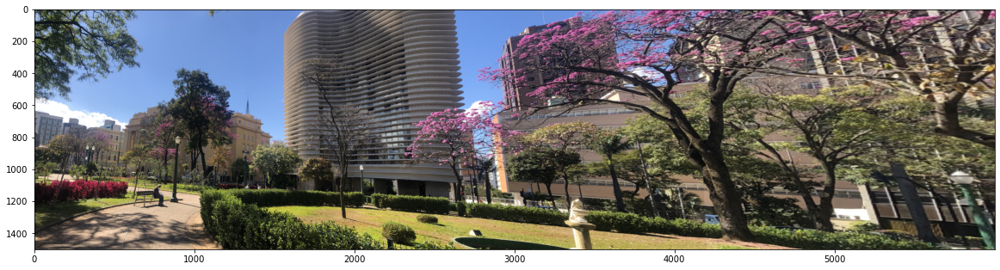

In [63]:
out = mosaic("set1", descriptor_type='SIFT', blending_type=None)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

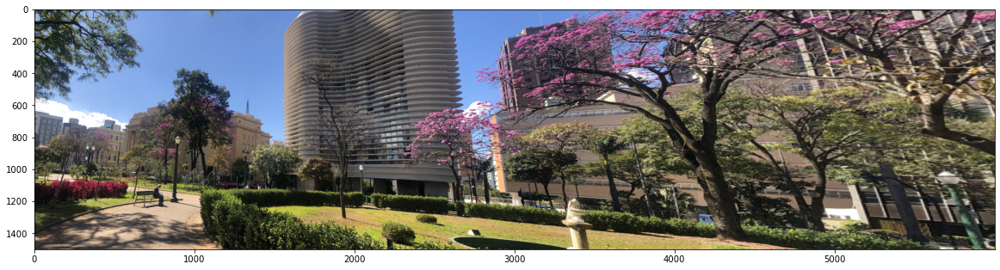

In [64]:
out = mosaic("set1", descriptor_type='BRIEF', blending_type=None)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

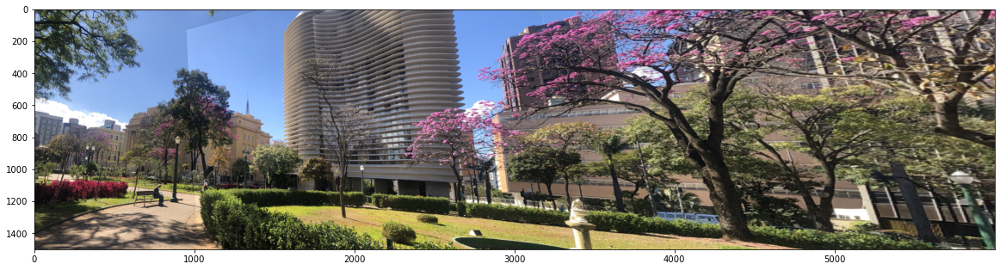

In [61]:
out = mosaic("set1", descriptor_type='SIFT', blending_type="MEAN")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

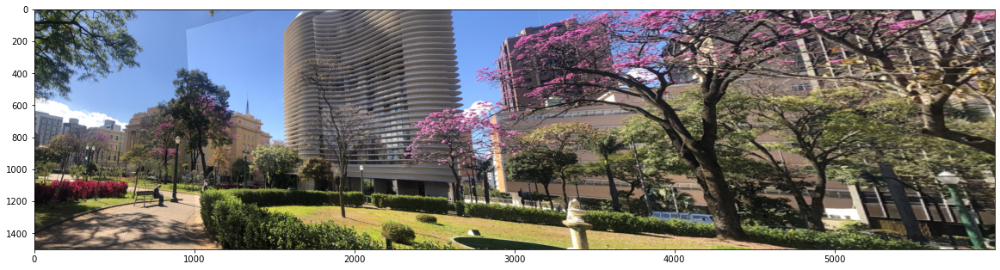

In [62]:
out = mosaic("set1", descriptor_type='BRIEF', blending_type="MEAN")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

<ipython-input-57-cfafbb695635>:115: RuntimeWarning: invalid value encountered in true_divide
  rweighted = (ldist*right/(rdist + ldist)).astype(np.uint8)
<ipython-input-57-cfafbb695635>:116: RuntimeWarning: invalid value encountered in true_divide
  lweighted = (ldist * left / (ldist + rdist)).astype(np.uint8)


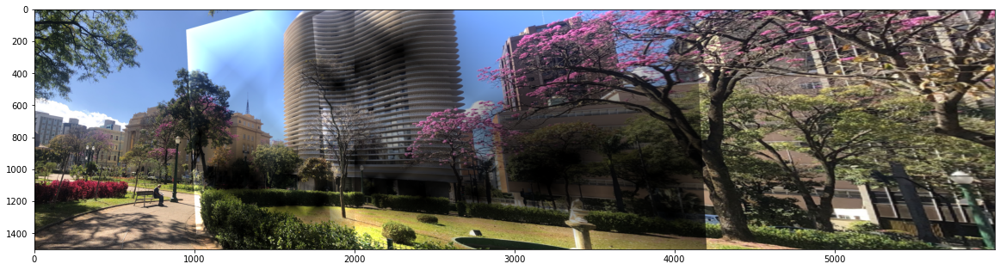

In [60]:
out = mosaic("set1", descriptor_type='SIFT', blending_type="FEATHERING")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

<ipython-input-57-cfafbb695635>:115: RuntimeWarning: invalid value encountered in true_divide
  rweighted = (ldist*right/(rdist + ldist)).astype(np.uint8)
<ipython-input-57-cfafbb695635>:116: RuntimeWarning: invalid value encountered in true_divide
  lweighted = (ldist * left / (ldist + rdist)).astype(np.uint8)


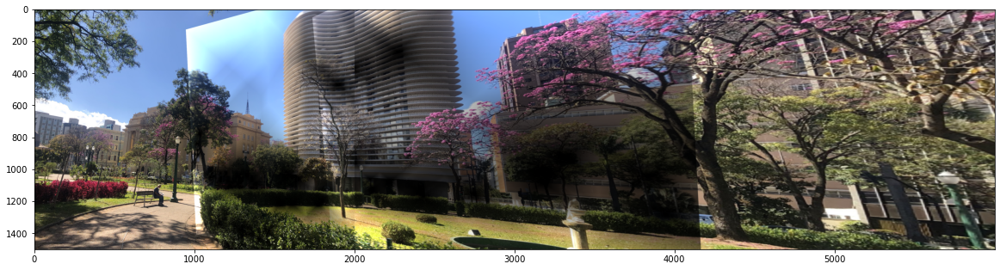

In [58]:
out = mosaic("set1", descriptor_type='BRIEF', blending_type="FEATHERING")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

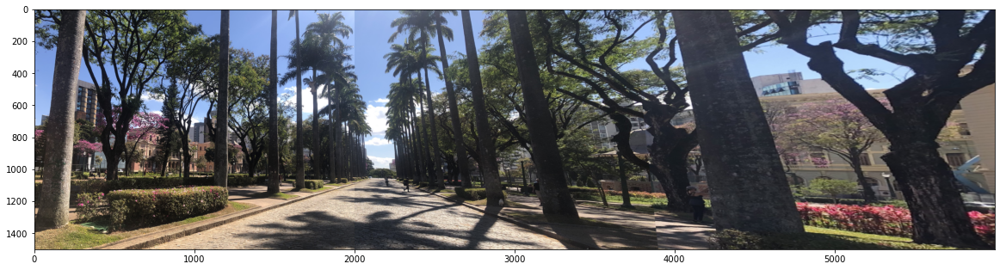

In [65]:
out = mosaic("set2", descriptor_type='SIFT', blending_type=None)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

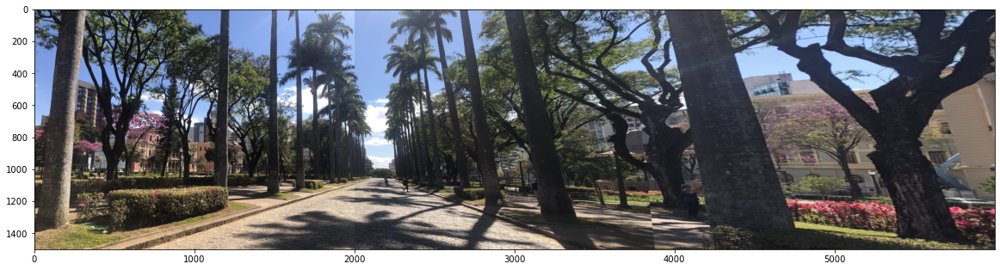

In [66]:
out = mosaic("set2", descriptor_type='BRIEF', blending_type=None)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

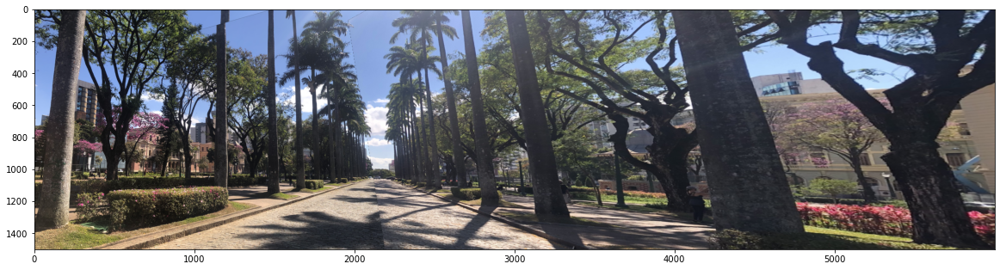

In [67]:
out = mosaic("set2", descriptor_type='SIFT', blending_type="MEAN")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

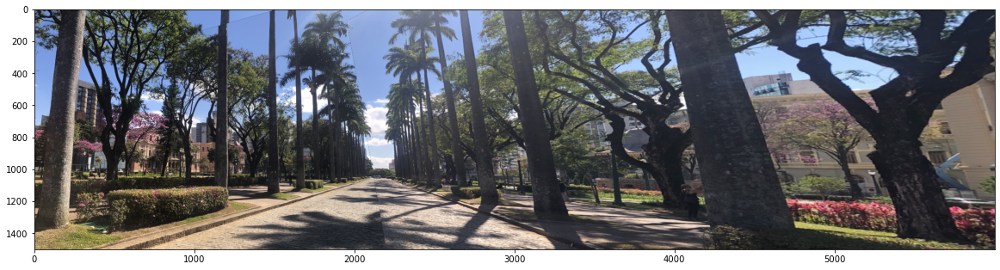

In [68]:
out = mosaic("set2", descriptor_type='BRIEF', blending_type="MEAN")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

<ipython-input-57-cfafbb695635>:115: RuntimeWarning: invalid value encountered in true_divide
  rweighted = (ldist*right/(rdist + ldist)).astype(np.uint8)
<ipython-input-57-cfafbb695635>:116: RuntimeWarning: invalid value encountered in true_divide
  lweighted = (ldist * left / (ldist + rdist)).astype(np.uint8)


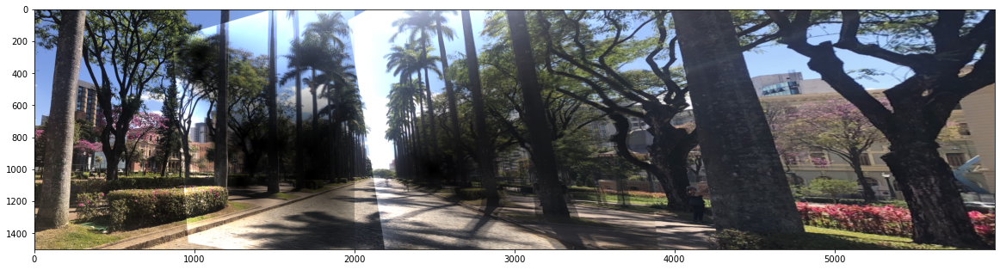

In [69]:
out = mosaic("set2", descriptor_type='SIFT', blending_type="FEATHERING")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

<ipython-input-57-cfafbb695635>:115: RuntimeWarning: invalid value encountered in true_divide
  rweighted = (ldist*right/(rdist + ldist)).astype(np.uint8)
<ipython-input-57-cfafbb695635>:116: RuntimeWarning: invalid value encountered in true_divide
  lweighted = (ldist * left / (ldist + rdist)).astype(np.uint8)


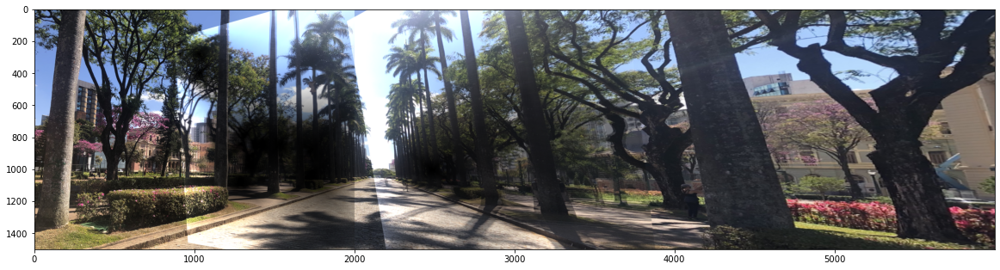

In [70]:
out = mosaic("set2", descriptor_type='BRIEF', blending_type="FEATHERING")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

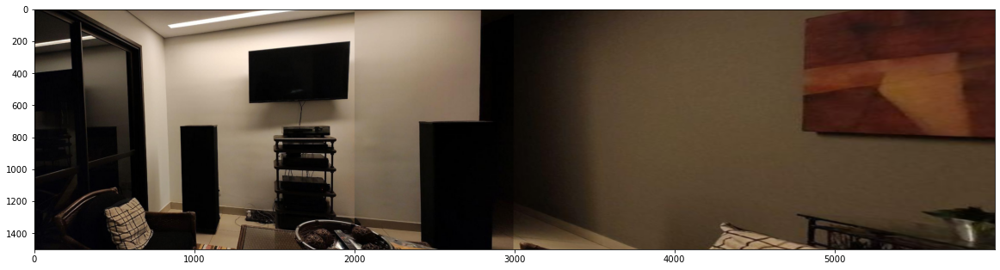

In [72]:
out = mosaic("set3", descriptor_type='SIFT', blending_type=None)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

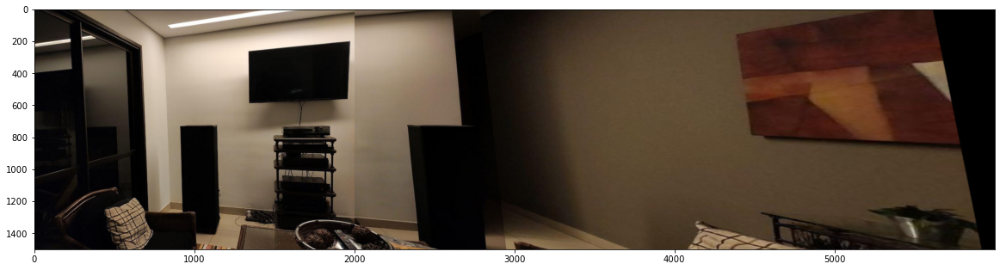

In [73]:
out = mosaic("set3", descriptor_type='BRIEF', blending_type=None)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

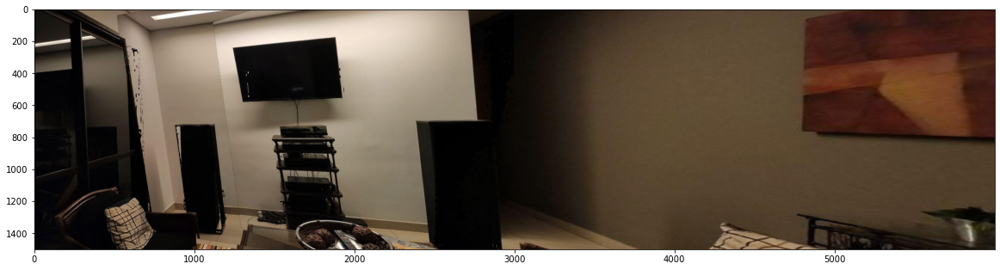

In [74]:
out = mosaic("set3", descriptor_type='SIFT', blending_type="MEAN")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

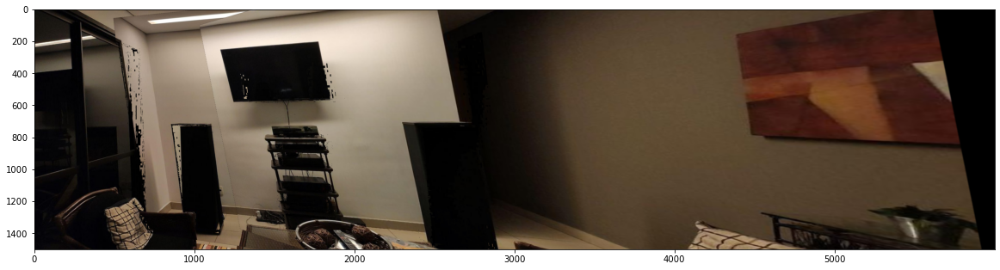

In [75]:
out = mosaic("set3", descriptor_type='BRIEF', blending_type="MEAN")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

<ipython-input-57-cfafbb695635>:115: RuntimeWarning: invalid value encountered in true_divide
  rweighted = (ldist*right/(rdist + ldist)).astype(np.uint8)
<ipython-input-57-cfafbb695635>:116: RuntimeWarning: invalid value encountered in true_divide
  lweighted = (ldist * left / (ldist + rdist)).astype(np.uint8)


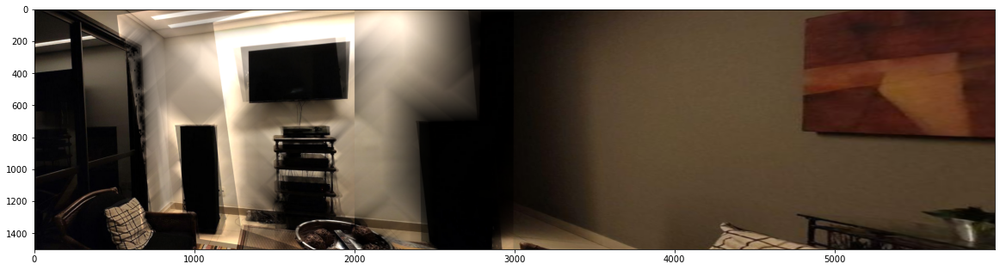

In [76]:
out = mosaic("set3", descriptor_type='SIFT', blending_type="FEATHERING")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

<ipython-input-57-cfafbb695635>:115: RuntimeWarning: invalid value encountered in true_divide
  rweighted = (ldist*right/(rdist + ldist)).astype(np.uint8)
<ipython-input-57-cfafbb695635>:116: RuntimeWarning: invalid value encountered in true_divide
  lweighted = (ldist * left / (ldist + rdist)).astype(np.uint8)


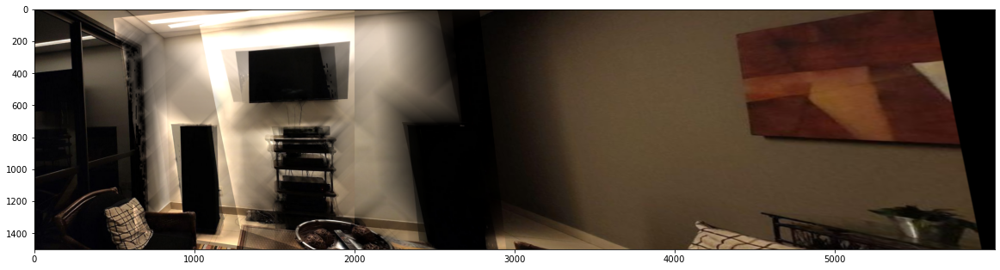

In [77]:
out = mosaic("set3", descriptor_type='BRIEF', blending_type="FEATHERING")
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

As we can see the results were suboptimal specially when blending the images. The feathering is completely off, and the mean leaves artifacts near the edges, the author was simply incapable of implementing it properly. Also since thresholding is used to get the mask for blending, completely black pixels can be mistakenly excluded from the mask, as was the case with the last set of pictures. This could be fixed by making every pixel in the input images almost black, but not quite, by adding a small value to them. Nonetheless we can observe that the iamges with the best quality were the ones that used no blending method. As for the descriptors used both SIFT and BRIEF descriptors had simmilar results, with the biggest difference being that BRIEF was much faster to compute.

A big source of problems was the way we're stitching the images, the leftmost image is always 1:1, and the further right a image is stiched the bigger the distortion, as we can see shown bellow
<img src="./distortion.jpg" width=700>

This method of stitching is very simple to understand and implement, but as a tradeoff a lot of the image is cropped, and heavily distorted. Not only that but it also makes blending images together much harder. 

A stitching method that would be much better would be to stitch the images together in a black mat, similar to what was presented in the classroom. By doing that, although the images would still be distorted, the distortion would be less aparent since the angles at wich the image was distorted would be clearer, not only that, but instead of having the leftmost image be 1:1, we could have the center image be 1:1, and warp the left and right images to fit it. Also since the black mat is bigger than all images stitched together, nothing would be cropped out. Blending would also be easier since we could work with each image individually, instead of having to work with an already stitched up image to do the blending. We were able to find some resources online that implemented this method, however the author does not feel comfortable implementing something that he did not fully understand. Therefore in this quiz we stuck to the naive way to stitch images.
